In [1]:
import numpy as np
import logging
import joblib
import matplotlib.pyplot as plt
import matplotlib2tikz

from matplotlib.patches import Rectangle, ConnectionPatch
from functools import partial
from os.path import join, isfile

from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

from cvdatasets.annotations import AnnotationType
from cvdatasets.dataset import AnnotationsReadMixin
from cvdatasets.dataset import PartMixin
from cvdatasets.dataset import IteratorMixin
from cvdatasets.utils import new_iterator


from chainer_addons.models import ModelType
from chainer_addons.models import PrepareType
from chainer_addons.links.pooling import PoolingType

import chainer
from chainer.dataset.convert import concat_examples
from chainer.cuda import to_cpu

chainer.__version__

'4.2.0'

In [74]:
class Args(object):
    tex_figures           = "/home/korsch/Repos/PhD/publications/2019-L1_SVM_Parts/figures/"
    
    data                  = "/home/korsch/Data/info.yml"
    dataset               = "CUB200"
    parts                 = "GT2"
    model_type            = "inception"
    
    # weights               = "rmsprop.LR1e-3.from_scratch.g_avg_pooling/model_final.npz"
    # weights               = "sgd.LR1e-2.from_scratch.g_avg_pooling/model_final.npz"
    # weights               = "rmsprop.LR1e-4.step2.g_avg_pooling/ft_model_epoch050/model_final.npz"
    weights               = None #"rmsprop.g_avg_pooling/model.inat.ckpt/model_final.npz"
    pooling               = PoolingType.G_AVG.name
    prepare_type          = PrepareType.MODEL.name
    clf_outputs           = "/home/korsch/Repos/PhD/00_SVM_Baseline/.out"
    part_clf              = f"{clf_outputs}/clf_svm_{dataset}_{parts}.{model_type}_all_parts.npz"
    swap_channels         = True
    input_size            = 427
    label_shift           = 0
    
    cls                   = 1
    
    n_jobs                = 1
    
    
    channel_axis          = 1
    shuffle               = False
    
    gpu                   = [0]
    batch_size            = 10

args = Args()
GPU = args.gpu[0]

logging.basicConfig(
    format='%(message)s',
    level=logging.INFO
)

def _tex_file(fname): 
    return None
    return join(args.tex_figures, fname)


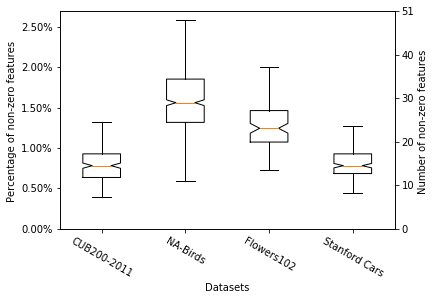

In [75]:
def visualize_sparsity(datasets, names, tex_file=None):
    global args
    fmt = join(args.clf_outputs, "clf_svm_{dataset}_GLOBAL.inception_glob_only_sparse_coefs.npz")
    clfs = [joblib.load(fmt.format(dataset=dataset)) for dataset in datasets]
    
    n_feats = clfs[0].coef_.shape[1]
    coefs = [(clf.coef_!=0).mean(axis=1) for clf in clfs]
    
    fig, ax = plt.subplots()
    
    ax.boxplot([c*100 for c in coefs], notch=True, showfliers=False)
    ax2 = ax.twinx()
    #ax2.boxplot(abs_coefs, notch=True, showfliers=False)
    
    ax.set_xticklabels(names, rotation=-30)
    ax.set_xlabel("Datasets")
    
    ax2.set_xticklabels(names, rotation=-30)
    ax2.set_xlabel("Datasets")
    
    ax.set_ylim(bottom=0)
    ax2.set_ylim(bottom=0)
    
    ys = ax.get_yticks()
    ax.set_yticklabels(['{:.2f}%'.format(y) for y in ys])
    ax.set_ylabel("Percentage of non-zero features ")
    
    ax2.set_yticklabels(['{:d}'.format(int(y / 100 * n_feats)) for y in ys])
    ax2.set_ylabel("Number of non-zero features ")

    if tex_file is None:
        plt.show()
    else:
        matplotlib2tikz.save(tex_file)
    
    plt.close()

visualize_sparsity(
    datasets=["CUB200", "NAB", "FLOWERS", "CARS"], 
    names=["CUB200-2011", "NA-Birds", "Flowers102", "Stanford Cars"],
    tex_file=_tex_file("sparsity.tex")
)

In [76]:
assert isfile(args.part_clf), f"Could not find the classifier: \"{args.part_clf}\"!"

clf = joblib.load(args.part_clf)
logging.info(f"Loadded classifier {clf} from \n\"{args.part_clf}\"")

/home/korsch/.anaconda3/envs/chainer4/lib/python3.6/site-packages/sklearn/base.py:253: UserWarning: Trying to unpickle estimator LinearSVC from version 0.20.1 when using version 0.20.3. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
Loadded classifier LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0) from 
"/home/korsch/Repos/PhD/00_SVM_Baseline/.out/clf_svm_CUB200_GT2.inception_all_parts.npz"


In [77]:
annot_cls = AnnotationType.get(args.dataset).value
part_key = f"{args.dataset}_{args.parts}"
annot = annot_cls(args.data, part_key,
                  feature_model=args.model_type)


data_info = annot.info
model_info = data_info.MODELS[args.model_type]
part_info = data_info.PARTS[part_key]

logging.info(f"Loaded {part_key} annotations")

Loaded CUB200_GT2 annotations


In [78]:
_dataset = partial(annot.new_dataset)

train, test = map(_dataset, ["train", "test"])

logging.info(f"Loaded {len(train)} training and {len(test)} test samples")
logging.info(f"Loaded {train.features.shape} training and {test.features.shape} test features")

Loaded 5994 training and 5794 test samples
Loaded (5994, 5, 2048) training and (5794, 5, 2048) test features


In [79]:
def _invoker(clf, data, method, no_labels=False, global_only=False):
    func = getattr(clf, method)
    if global_only:
        X = data.features[:, -1, :]
    else:
        X = data.features.reshape(len(data), -1)
    if no_labels:
        return func(X)
    else:
        return func(X, data.labels)

score = partial(_invoker, method="score")
fit = partial(_invoker, method="fit")
predict = partial(_invoker, method="predict", no_labels=True)

In [80]:
print(score(clf, train), score(clf, test))

1.0 0.8988608905764585


In [81]:
DUMP = True
load_key = f"global_svm_{part_key}.npz"

if DUMP and isfile(load_key):
    logging.info(f"Loading global SVM from \"{load_key}\"")
    _clf = joblib.load(load_key)
else:
    logging.info("Train new global SVM")
    _clf = LinearSVC()
    %time fit(_clf, train, global_only=True)
    if DUMP:
        logging.info(f"Saving SVM to \"{load_key}\"")
        joblib.dump(_clf, load_key)
    

Train new global SVM
Saving SVM to "global_svm_CUB200_GT2.npz"


CPU times: user 36.6 s, sys: 53.4 ms, total: 36.7 s
Wall time: 36.7 s


In [82]:
print(score(_clf, train, global_only=True), score(_clf, test, global_only=True))

1.0 0.882119433897135


In [83]:
y = test.labels

part_y = predict(clf, test)
glob_y = predict(_clf, test, global_only=True)

part_pred = part_y == y
glob_pred = glob_y == y

In [116]:
def plot_conf_matrix(pred, 
                     c0=50, 
                     c1=75,
                     C="red",
                     linewidth=2,
                     tex_file=None,
                     **kwargs):
    mat = np.log(confusion_matrix(y, pred)+1)

    fig, axs = plt.subplots(1,2, **kwargs)
    

    out = axs[0].imshow(mat)
    axs[0].get_xaxis().set_ticks([])
    axs[0].get_yaxis().set_ticks([])
    cbar = fig.colorbar(out, 
                 ax=axs, 
                 orientation='horizontal', 
                 fraction=0.09,
                 pad=0.03,
                 aspect=80
                )
    cbar.ax.tick_params(labelsize=18)
    
    line_axis = fig.add_axes((0.1,0.2,.8,.6))
    line_axis.axis('off')


    axs[0].add_patch(Rectangle(
        (c0,c0), 
        c1-c0, c1-c0, 
        fill=False, 
        color=C,
        linewidth=linewidth,
    ))

    axs[1].imshow(mat[c0:c1, c0:c1])
    axs[1].get_xaxis().set_ticks([])
    axs[1].get_yaxis().set_ticks([])


    con = ConnectionPatch(
        xyA=(c1, c0), 
        xyB=(-0.5, -0.5),
        coordsA="data", coordsB="data",
        axesA=axs[0], axesB=axs[1],
        arrowstyle="-", clip_on=False,
        color=C, linewidth=linewidth,
    )
    line_axis.add_artist(con)

    con = ConnectionPatch(
        xyA=(c1, c1), 
        xyB=(-0.5, c1-c0-0.5),
        coordsA="data", coordsB="data",
        axesA=axs[0], axesB=axs[1],
        arrowstyle="-", clip_on=False,
        color=C, linewidth=linewidth,
    )
    line_axis.add_artist(con)
    if tex_file is None:
        plt.show()
    else:
        matplotlib2tikz.save(tex_file)
    plt.close()

# Global-Based Confusion Matrix

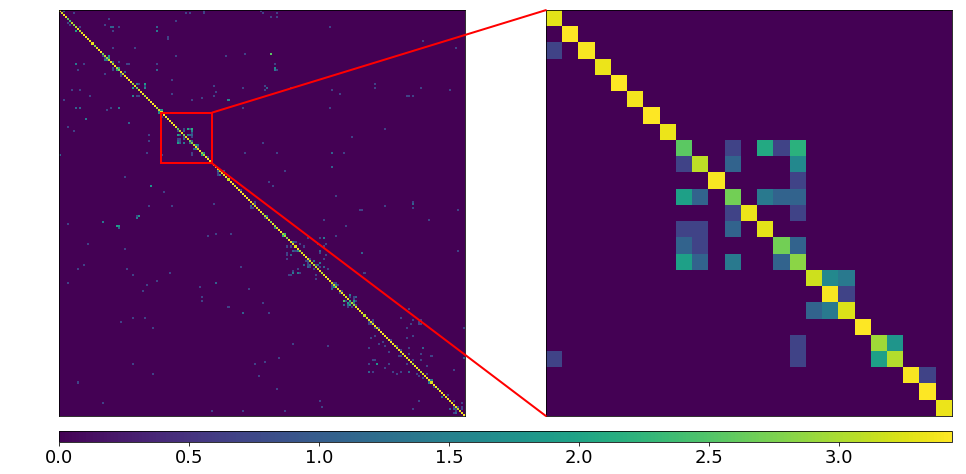

In [117]:
 # classes 59 - 66
plot_conf_matrix(glob_y, 50, 75, figsize=(16, 9),
                tex_file=_tex_file("glob-conf-matrix-0.tex")
                )

# plot_conf_matrix(glob_y, 110, 135, figsize=(16, 9),
#                 tex_file=_tex_file("glob_conf_matrix_1.tex"))

# plot_conf_matrix(glob_y, 130, 155, figsize=(16, 9),
#                 tex_file=_tex_file("glob_conf_matrix_1.tex"))

# Part-Based Confusion Matrix

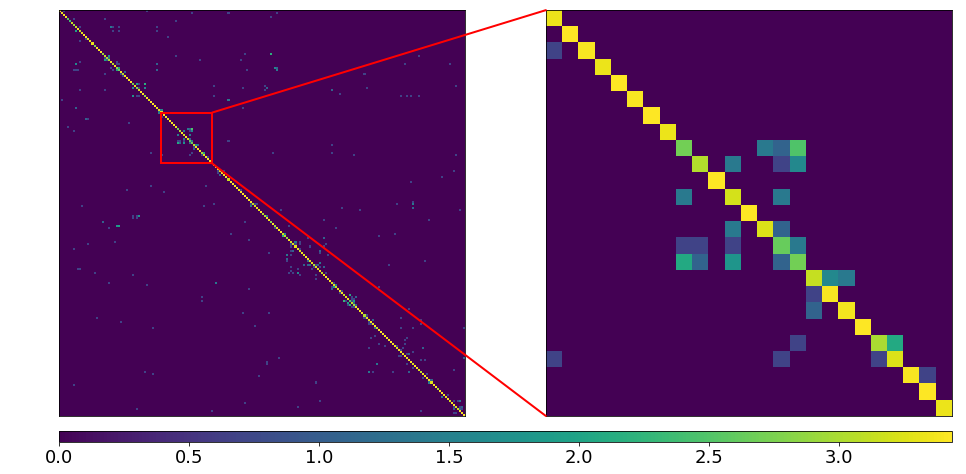

In [118]:
plot_conf_matrix(part_y, 50, 75, figsize=(16, 9))
# plot_conf_matrix(part_y, 110, 135, figsize=(16, 9))
# plot_conf_matrix(part_y, 130, 155, figsize=(16, 9))

In [104]:
def plot_im_and_parts(idxs):

    for idx in idxs:
        im, parts, lab = test[idx]
        n_parts = len(parts._parts)
        
        n_rows = int(np.ceil(np.sqrt(n_parts)))
        n_cols = int(np.ceil(n_parts / n_rows))
                     

        glob_p = _clf.predict(test.features[idx, -1].reshape(1, -1))[0]
        part_p = clf.predict(test.features[idx].reshape(1, -1))[0]

        fig, ax = plt.subplots(figsize=(16,9))

        ax.axis("off")
        ax.imshow(im)
        ax.set_title(f"GT: {lab}, global prediction: {glob_p}, part prediction: {part_p}")
        parts.plot(im=im, ax=ax, ratio=0, 
                   fill=True,
                   alpha=0.7,
                   linestyle="-",
                   linewidth=3
                  )

#         fig, axs = plt.subplots(n_rows, n_cols, figsize=(16,9))
#         part_crops = parts.visible_crops(im, ratio=0) # here ratio is not used
#         for i, crop in enumerate(part_crops):
#             _i = np.unravel_index(i, axs.shape)
#             ax = axs[_i]
#             ax.imshow(crop)
#             ax.axis("off")
#             ax.set_title(f"Part #{i}")
    
#         for i in range(n_parts, n_rows*n_cols):
#             _i = np.unravel_index(i, axs.shape)
#             axs[_i].axis("off")
            
        plt.show()
        plt.close()

In [105]:
mask = test.labels == 13

_and, _not = np.logical_and, np.logical_not 
part_and_not_glob = _and(_and(_not(glob_pred), part_pred), mask)
glob_and_not_part = _and(_and(glob_pred, _not(part_pred)), mask)

both_positive = _and(_and(glob_pred, part_pred), mask)
both_negative = _and(_and(_not(glob_pred), _not(part_pred)), mask)

print(both_positive.sum())
print(both_negative.sum())
print(part_and_not_glob.sum())
print(glob_and_not_part.sum())

28
0
1
1


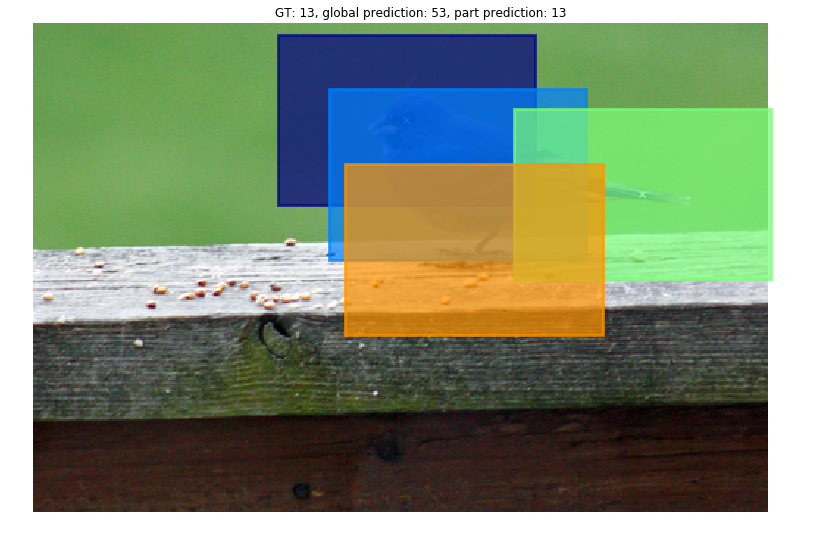

In [106]:
idxs0 = np.where(part_and_not_glob)[0]
plot_im_and_parts(idxs0)

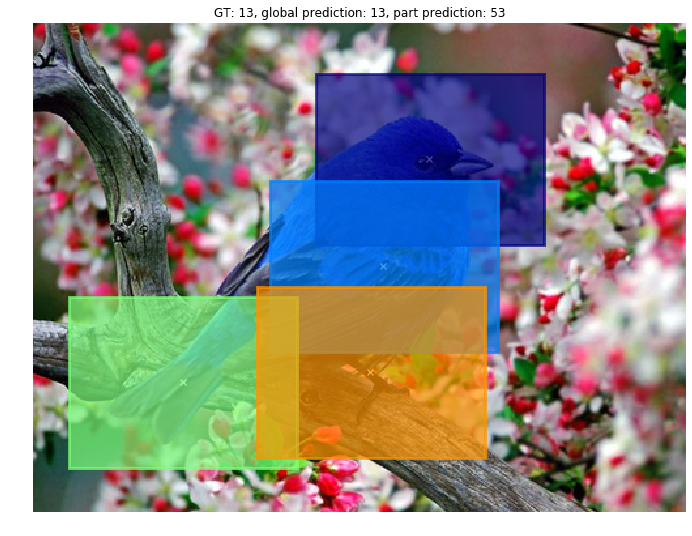

In [107]:
idxs1 = np.where(glob_and_not_part)[0]
plot_im_and_parts(idxs1)

In [108]:
idxs2 = np.where(both_negative)[0]
plot_im_and_parts(idxs2)

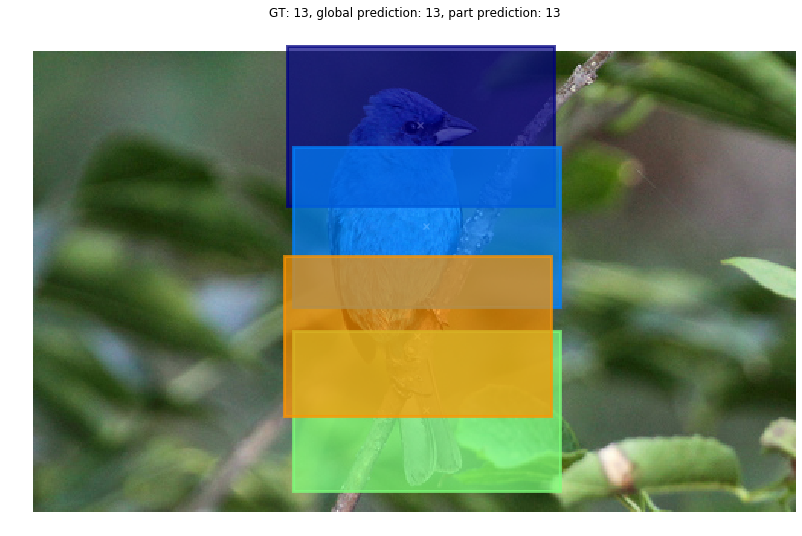

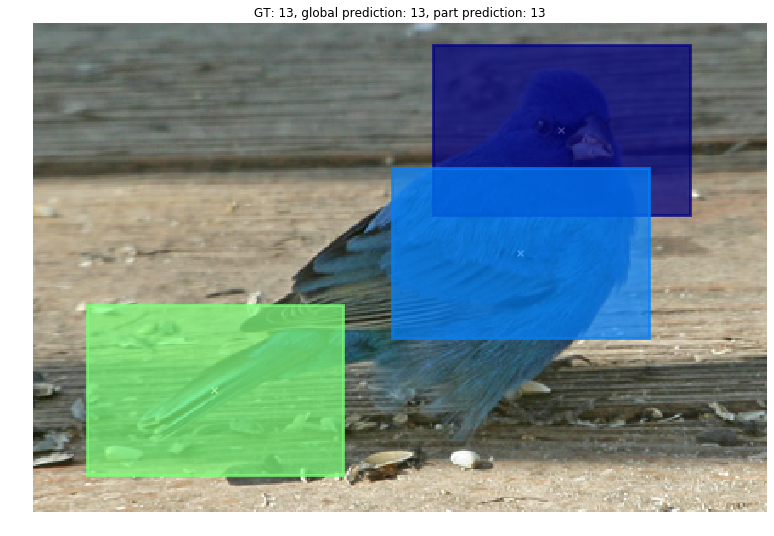

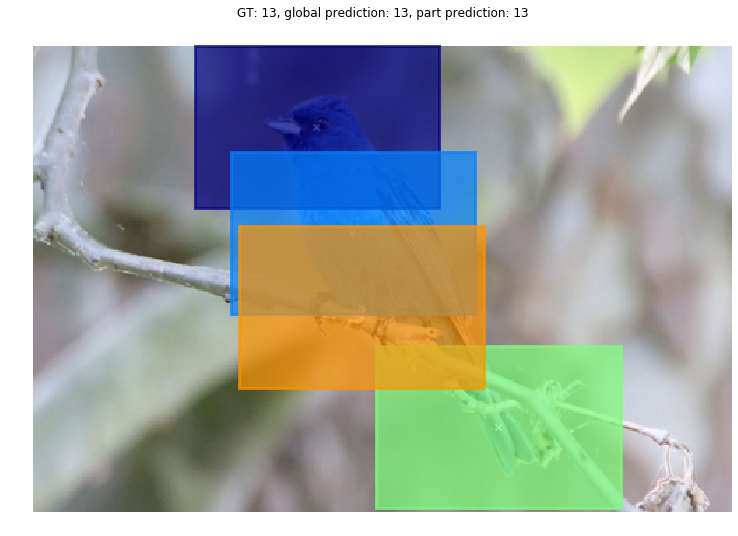

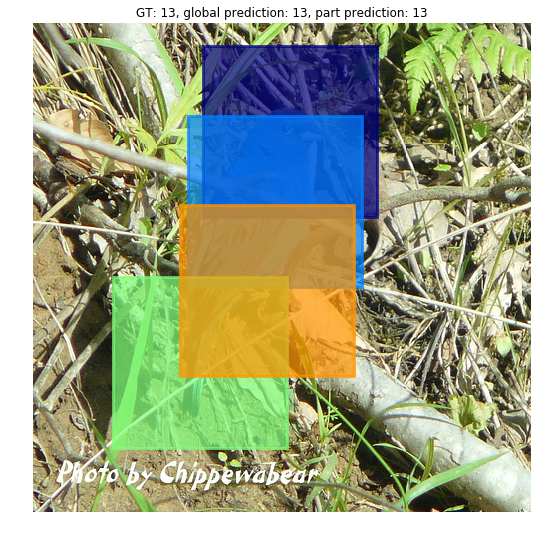

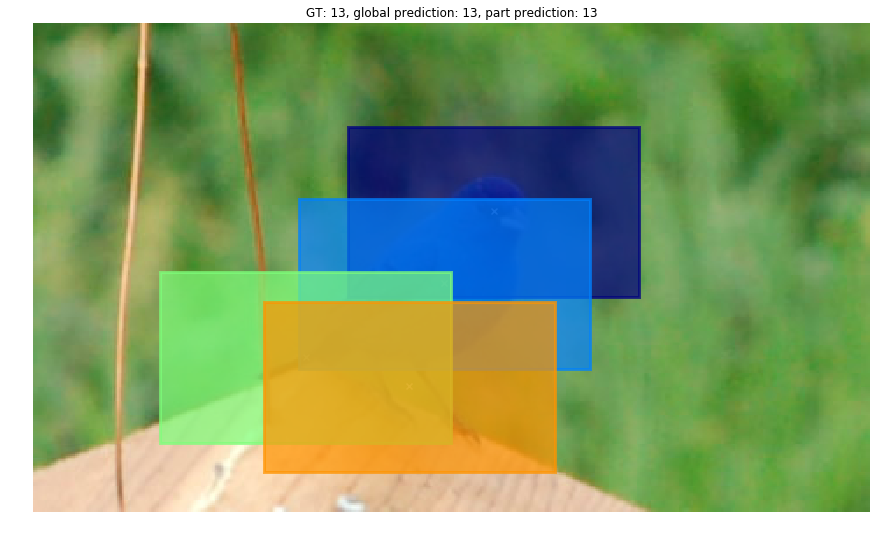

...

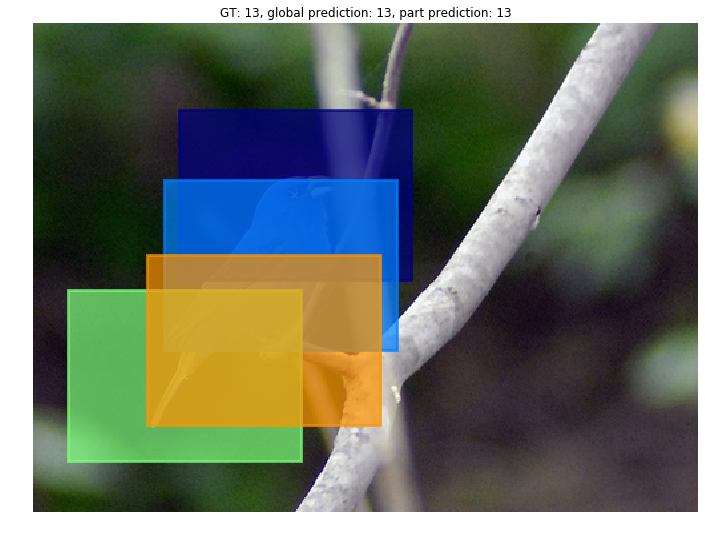

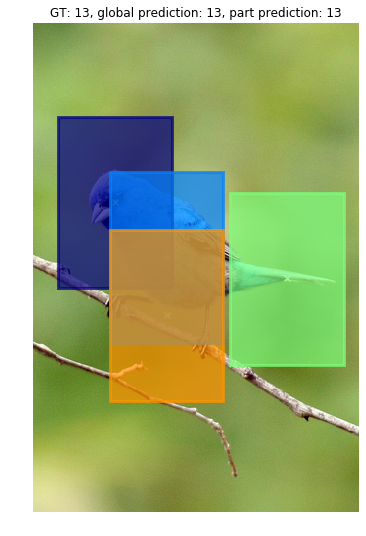

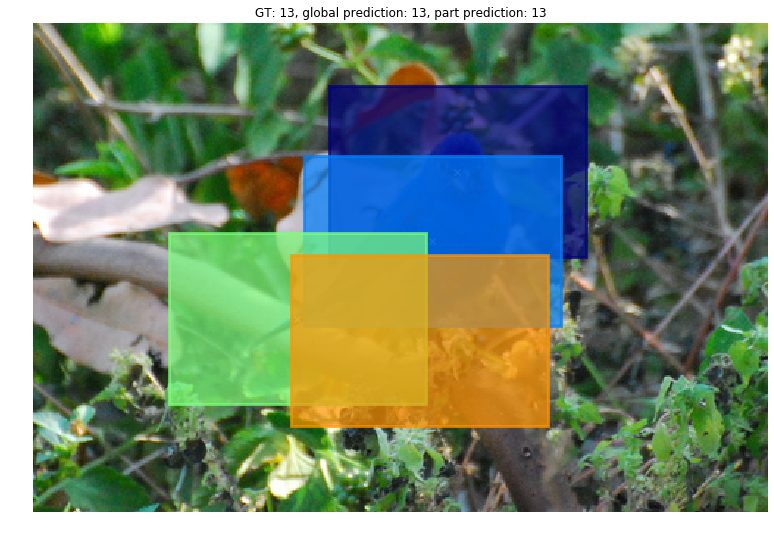

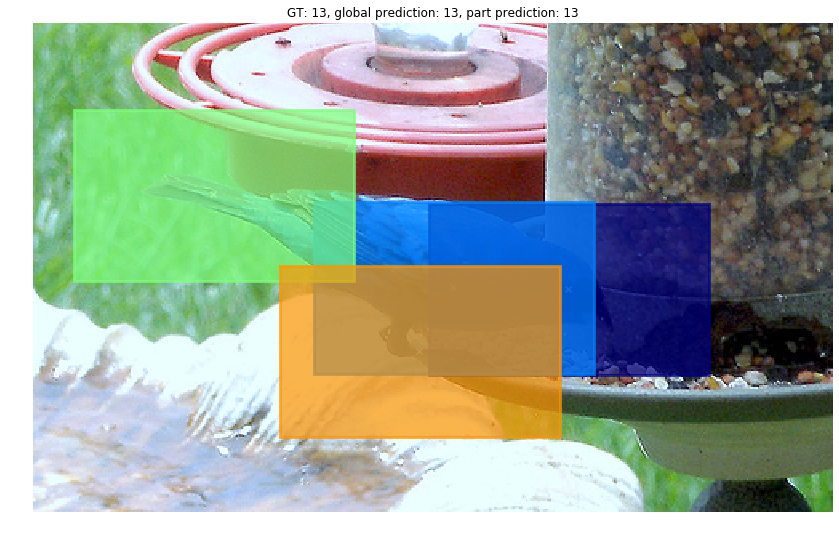

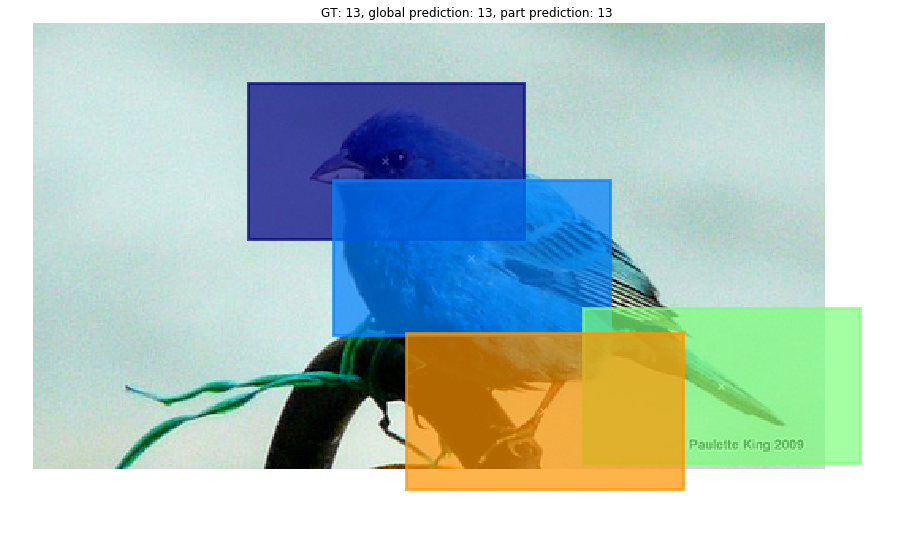

In [109]:
idxs2 = np.where(both_positive)[0]
plot_im_and_parts(idxs2)